# Câu 2 - Nguyễn Tấn Hưng - 22C15007 - Sử dụng CNN


In [1]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import pathlib

dataset_url = "/content/drive/MyDrive/Landmark_Classification"
data_dir = pathlib.Path(dataset_url)

In [4]:
image_count = len(list(data_dir.glob('**/*.jpg')))
print(image_count)

3000


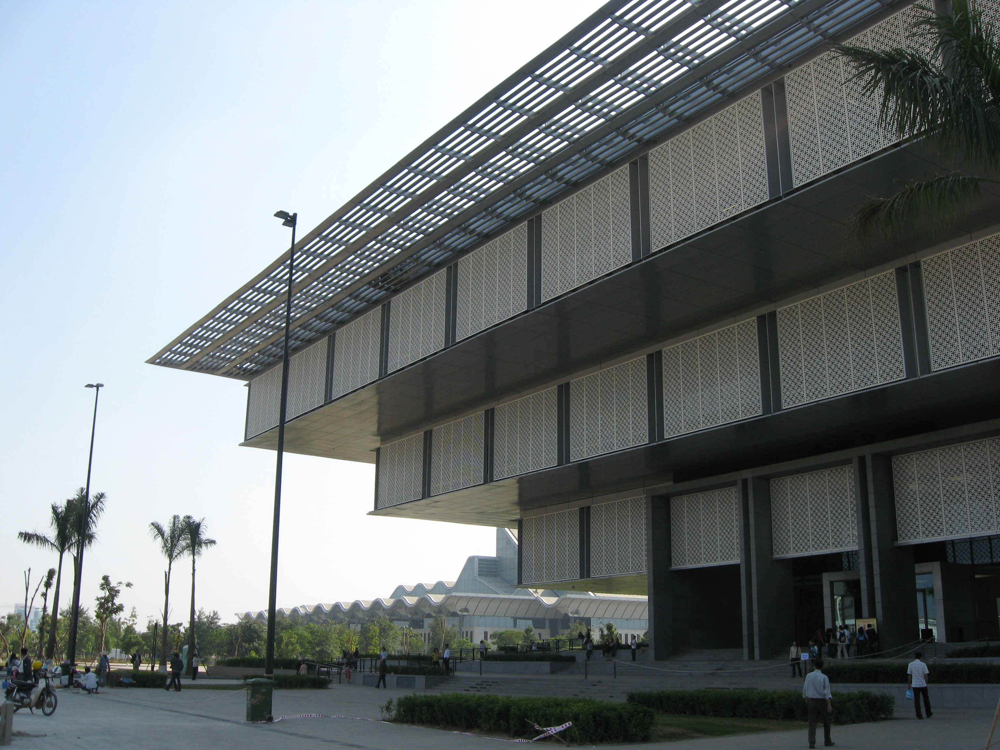

In [5]:
hanoimuseum = list(data_dir.glob('train/bao_tang_ha_noi/*'))
PIL.Image.open(str(hanoimuseum[0]))

In [6]:
batch_size = 32
img_height = 180
img_width = 180

In [7]:
data_dir_train = pathlib.Path('%s/train' % data_dir).with_suffix('')
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir_train,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 1500 files belonging to 30 classes.
Using 1200 files for training.


In [8]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir_train,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 1500 files belonging to 30 classes.
Using 300 files for validation.


In [9]:
class_names = train_ds.class_names
print(class_names)

['bao_tang_ha_noi', 'buu_dien_trung_tam_tphcm', 'cau_long_bien', 'cau_nhat_tan', 'cau_rong', 'cho_ben_thanh_tphcm', 'chua_cau', 'chua_mot_cot', 'chua_thien_mu', 'cot_co', 'hoang_thanh', 'hon_chong_nhatrang', 'landmark81', 'lang_bac', 'lang_khai_dinh', 'mui_ca_mau', 'mui_ke_ga_phanthiet', 'nha_hat_lon_hanoi', 'nha_hat_lon_tphcm', 'nha_tho_da_co_sapa', 'nha_tho_lon_ha_noi', 'quang_truong_lam_vien', 'suoi_tien_tphcm', 'thac_ban_gioc', 'thap_cham', 'thap_rua', 'toa_nha_bitexco_tphcm', 'tuong_chua_kito_vungtau', 'ubnd_tphcm', 'van_mieu']


## Hiển thị dữ liệu

Dưới đây là chín hình ảnh đầu tiên từ tập dữ liệu huấn luyện:

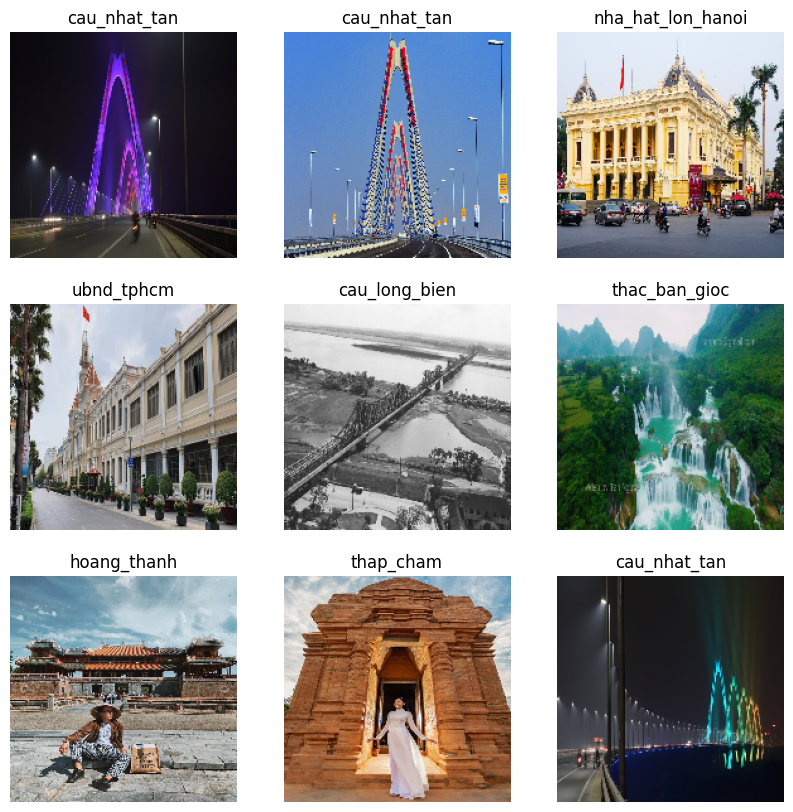

In [10]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [11]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 180, 180, 3)
(32,)


## Configure để cải thiện tốc độ

In [12]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

## Chuẩn hoá dữ liệu

In [13]:
normalization_layer = layers.Rescaling(1./255)

Dữ liệu sau khi chuẩn hoá sẽ về dạng 0, 1

In [14]:
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
print(np.min(first_image), np.max(first_image))

0.0 1.0


## Lượng dữ liệu đầu vào hơi ít, nên sử dụng một vài kỹ thuật để tạo thêm dữ liệu huấn luyện. Ở đây học viên áp dụng lật ảnh, xoay ảnh, zoom ảnh.

In [15]:
data_augmentation = keras.Sequential(
  [
    layers.RandomFlip("horizontal",
                      input_shape=(img_height,
                                  img_width,
                                  3)),
    layers.RandomRotation(0.2),
    layers.RandomZoom(0.2),
  ]
)

Hiển thị ảnh để xem thử

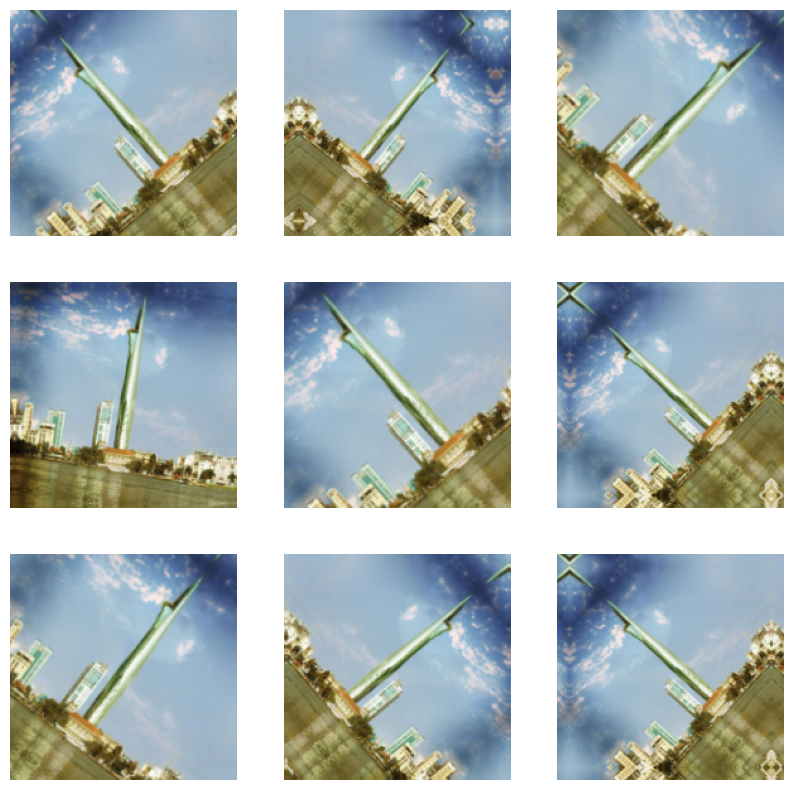

In [16]:
plt.figure(figsize=(10, 10))
for images, _ in train_ds.take(1):
  for i in range(9):
    augmented_images = data_augmentation(images)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(augmented_images[0].numpy().astype("uint8"))
    plt.axis("off")

In [17]:
num_classes = len(class_names)

#Model Building
model = Sequential()
model.add(layers.Conv2D(32,3,padding="same", activation="relu", input_shape=(img_height,img_width,3)))
model.add(layers.MaxPool2D())
model.add(layers.Conv2D(32, 3, padding="same", activation="relu"))
model.add(layers.MaxPool2D())
model.add(layers.Conv2D(64, 3, padding="same", activation="relu"))
model.add(layers.MaxPool2D())
model.add(layers.Dropout(0.4))
model.add(layers.Flatten())
model.add(layers.Dense(128,activation="relu"))
model.add(layers.Dense(num_classes, activation="softmax"))

## Compile and train the model

In [18]:
#Compile model
from tensorflow.keras.optimizers import RMSprop
optimizer= RMSprop(learning_rate=0.001,rho=0.9,epsilon=1e-08)
model.compile(optimizer=optimizer,
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 180, 180, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 90, 90, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 90, 90, 32)        9248      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 45, 45, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 45, 45, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 22, 22, 64)      

In [19]:
epochs = 15
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/15
38/38 [==============================] - 66s 1s/step - loss: 44.7716 - accuracy: 0.0742 - val_loss: 3.1189 - val_accuracy: 0.1567
Epoch 2/15
38/38 [==============================] - 2s 43ms/step - loss: 2.7383 - accuracy: 0.2900 - val_loss: 3.0190 - val_accuracy: 0.2367
Epoch 3/15
38/38 [==============================] - 2s 43ms/step - loss: 2.5156 - accuracy: 0.4908 - val_loss: 2.7543 - val_accuracy: 0.3567
Epoch 4/15
38/38 [==============================] - 2s 41ms/step - loss: 1.9926 - accuracy: 0.6675 - val_loss: 3.3432 - val_accuracy: 0.3967
Epoch 5/15
38/38 [==============================] - 2s 41ms/step - loss: 1.1358 - accuracy: 0.7917 - val_loss: 3.4526 - val_accuracy: 0.4167
Epoch 6/15
38/38 [==============================] - 2s 40ms/step - loss: 1.5369 - accuracy: 0.8675 - val_loss: 5.6521 - val_accuracy: 0.3300
Epoch 7/15
38/38 [==============================] - 2s 43ms/step - loss: 0.3602 - accuracy: 0.9192 - val_loss: 5.6594 - val_accuracy: 0.3733
Epoch 8/15
38

## Hiển thị biểu đồ kết quả huấn luyện

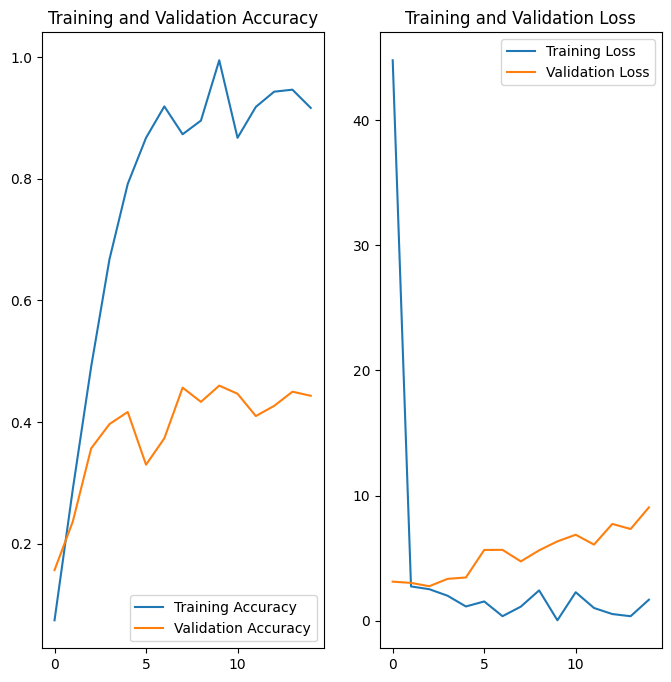

In [20]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

## Predict trên tập dữ liệu test

In [25]:
from sklearn.metrics import accuracy_score

data_dir_test_path = pathlib.Path('%s/test' % data_dir).with_suffix('')
test_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir_test_path,
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

predictions = []
labels = []
for x, y in test_ds:
    predictions.append(np.argmax(model(x), axis=-1))
    labels.append(y.numpy())

predictions = np.concatenate(predictions, axis=0)
labels = np.concatenate(labels, axis=0)

accuracy_score(labels, predictions)

Found 1500 files belonging to 30 classes.


0.37933333333333336

# Kiểm tra ngẫu nhiên một vài hình

Hiển thị cho dê nhìn, và tự kiểm tra lại mô hình

In [68]:
def my_predict(path):
  img = tf.keras.utils.load_img(
      path, target_size=(img_height, img_width)
  )
  img_array = tf.keras.utils.img_to_array(img)
  img_array = tf.expand_dims(img_array, 0) # Create a batch

  predictions = model.predict(img_array, verbose=0)
  score = tf.nn.softmax(predictions[0])

  return (
      "Đoán {} độ tự tin {:.2f}%."
      .format(class_names[np.argmax(score)], 100 * np.max(score))
  )

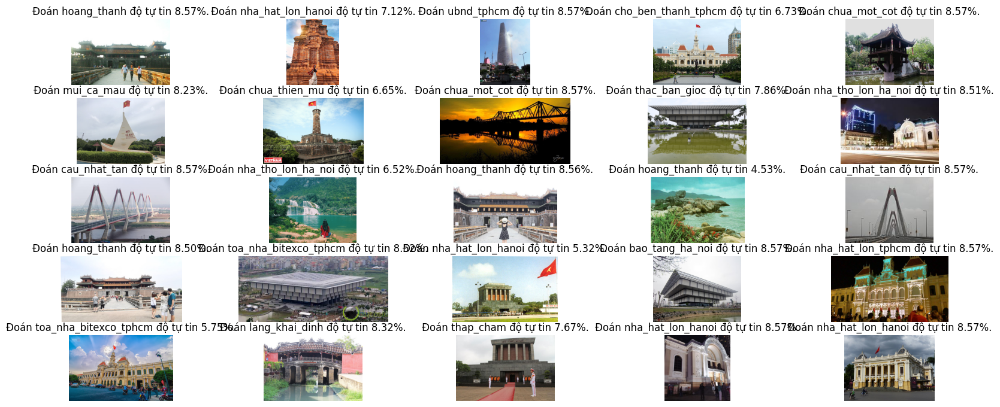

In [69]:
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random

# Lấy hình trong tập test và chọn ngẫu nhiên 25 tấm
raw_images = glob.glob('/content/drive/MyDrive/Landmark_Classification/test/**/*.jpg')
raw_images = random.sample(raw_images, 25)

images = []
for img_path in raw_images:
    images.append({ 'img': mpimg.imread(img_path), 'path': img_path})
fig = plt.figure(figsize=(20,10))
columns = 5
fig.tight_layout()
for i, image in enumerate(images):
    plt.subplot(int(len(images) / columns) + 1, columns, i + 1)
    plt.title(my_predict(image['path']))
    plt.imshow(image['img'])
    plt.axis("off")